# gameplan

## getting the data

- download a mini slice of images from my bucket in dsec, try to make it a bit parallel right away. for reference on how to access see dsec-det/scripts/dsec_to_r2.py
    the mini slice can come from here {here goes the r2 bucket url}/neuromorph-noise-data/dsec/train/zurich_city_02_b/ 
    it contains left and right calibrations disorted and rectified, for displaying and for the rest of the experiments we can focus on rectified, and right only
    still, load those folders to explore the data, one experiment can be applying the calibration to distorted, displayuig and see if they look the same after the calibration
- display the sample images and event, with the bounding boxes of the object detection labels
- display some insights of the data (eg, number of frames, event, size of the image etc)

## processing the data
- install v2e (https://github.com/SensorsINI/v2e)
- prepare the sample displayed before to the format v2e expects
- generate events of the whole sequence, no perturbations yet
- display generated events

## tinker a little
- display the events frm the dataset with generate events. do they look similar?
- apply noise to the rgb (https://github.com/bethgelab/imagecorruptions) use only one severity and noise for now, eg rain
    display the noised rgb, then generate events on the noised rgb, display the noised simuated events
- apply shot/gaussian noise (whatever noise is most similar to the one v2e generates by using their parameter) on rgb with the same library, now simulate events using CLEAN rgb, but this time use the noise parameter that shold resemple the intensity of noise on the smiulated one


## 1 — Setup & connect to R2

**Required non-standard dependency:** `hdf5plugin`

The DSEC `events.h5` files are compressed with **Blosc** (HDF5 filter 32001), which is not bundled with h5py.
Without it every dataset read raises `OSError: Can't synchronously read data (can't find plugin...)`.

```bash
pip install hdf5plugin
```

`hdf5plugin` must be imported **before** any h5py dataset reads — importing it self-registers the Blosc (and other) filters.

In [1]:
import boto3
import os
import numpy as np
import hdf5plugin  # must be imported before h5py reads Blosc-compressed datasets
import h5py
import cv2
import yaml
import matplotlib.pyplot as plt
from pathlib import Path
from concurrent.futures import ThreadPoolExecutor, as_completed
from dotenv import load_dotenv

# Load R2 credentials
load_dotenv("/home/jose/Documents/projects/neuromorph_vs_noise/dsec_data_managing/.env")

R2_ACCOUNT_ID = os.environ["R2_ACCOUNT_ID"]
R2_ACCESS_KEY = os.environ["R2_ACCESS_KEY"]
R2_SECRET_KEY = os.environ["R2_SECRET_KEY"]
R2_BUCKET     = os.environ["R2_BUCKET"]

s3 = boto3.client(
    "s3",
    endpoint_url=f"https://{R2_ACCOUNT_ID}.r2.cloudflarestorage.com",
    aws_access_key_id=R2_ACCESS_KEY,
    aws_secret_access_key=R2_SECRET_KEY,
    region_name="auto",
)

# Verify connection
s3.head_bucket(Bucket=R2_BUCKET)
print(f"Connected to R2 bucket: {R2_BUCKET}")

Connected to R2 bucket: neuromorph-noise-data


## 2 — Explore bucket structure

In [2]:
SEQUENCE = "dsec/train/zurich_city_02_b"

def list_r2_objects(prefix, delimiter="/", max_keys=1000):
    """List objects under a prefix, returns (common_prefixes, contents)."""
    resp = s3.list_objects_v2(
        Bucket=R2_BUCKET, Prefix=prefix, Delimiter=delimiter, MaxKeys=max_keys
    )
    prefixes = [p["Prefix"] for p in resp.get("CommonPrefixes", [])]
    contents = resp.get("Contents", [])
    return prefixes, contents

def count_r2_objects(prefix):
    """Count all objects under a prefix (handles pagination)."""
    count, token = 0, None
    while True:
        kwargs = dict(Bucket=R2_BUCKET, Prefix=prefix, MaxKeys=1000)
        if token:
            kwargs["ContinuationToken"] = token
        resp = s3.list_objects_v2(**kwargs)
        count += resp.get("KeyCount", 0)
        if not resp.get("IsTruncated"):
            break
        token = resp["NextContinuationToken"]
    return count

# Show the folder tree
print(f"Bucket structure under {SEQUENCE}/\n")
top_prefixes, _ = list_r2_objects(f"{SEQUENCE}/")

for tp in top_prefixes:
    folder_name = tp.rstrip("/").split("/")[-1]
    sub_prefixes, sub_files = list_r2_objects(tp)

    if sub_prefixes:
        print(f"  {folder_name}/")
        for sp in sub_prefixes:
            sub2_name = sp.rstrip("/").split("/")[-1]
            sp2_prefixes, sp2_files = list_r2_objects(sp)
            if sp2_prefixes:
                for sp3 in sp2_prefixes:
                    sub3_name = sp3.rstrip("/").split("/")[-1]
                    n = count_r2_objects(sp3)
                    sample = list_r2_objects(sp3, delimiter="", max_keys=1)[1]
                    size_info = f", ~{sample[0]['Size']/1e6:.1f} MB each" if sample else ""
                    print(f"    {sub2_name}/{sub3_name}/ -> {n} files{size_info}")
            else:
                for f in sp2_files:
                    fname = f["Key"].split("/")[-1]
                    print(f"    {sub2_name}/{fname} ({f['Size']/1e6:.1f} MB)")
    else:
        for f in sub_files:
            fname = f["Key"].split("/")[-1]
            print(f"  {folder_name}/{fname} ({f['Size']/1e6:.2f} MB)")

Bucket structure under dsec/train/zurich_city_02_b/

  calibration/cam_to_cam.yaml (0.01 MB)
  calibration/cam_to_lidar.yaml (0.00 MB)
  events/
    left/events.h5 (1925.0 MB)
    left/rectify_map.h5 (2.5 MB)
    right/events.h5 (1628.1 MB)
    right/rectify_map.h5 (2.5 MB)
  images/
    left/distorted/ -> 1225 files, ~0.5 MB each
    left/rectified/ -> 1225 files, ~2.5 MB each
    right/rectified/ -> 1225 files, ~2.5 MB each
  object_detections/
    left/tracks.npy (0.3 MB)


## 3 — Download mini slice

Downloads a small subset of the data for exploration:
- **Calibration** files (cam_to_cam.yaml, cam_to_lidar.yaml)
- **10 sample images** from each folder (left/distorted, left/rectified, right/rectified)
- **Object detection labels** (tracks.npy)
- **Event rectify maps** (left + right, ~2.5 MB each)
- **Timestamps** files
- **Events H5** for right camera only (~1.6 GB — downloaded separately)

In [3]:
DATA_DIR = Path("../data/dsec_sample/zurich_city_02_b")
DATA_DIR.mkdir(parents=True, exist_ok=True)

N_SAMPLE_IMAGES = 10  # how many images to download per folder

def download_file(r2_key, local_path):
    """Download a single file from R2 if it doesn't already exist locally."""
    local_path = Path(local_path)
    if local_path.exists():
        return f"skip  {local_path.name}"
    local_path.parent.mkdir(parents=True, exist_ok=True)
    s3.download_file(R2_BUCKET, r2_key, str(local_path))
    return f"done  {local_path.name}"

# Build the download manifest
downloads = []

# --- Calibration ---
for fname in ["cam_to_cam.yaml", "cam_to_lidar.yaml"]:
    downloads.append((
        f"{SEQUENCE}/calibration/{fname}",
        DATA_DIR / "calibration" / fname,
    ))

# --- Timestamps ---
for fname_key in [
    f"{SEQUENCE}/images/timestamps.txt",
    f"{SEQUENCE}/images/left/exposure_timestamps.txt",
    f"{SEQUENCE}/images/right/exposure_timestamps.txt",
]:
    rel = fname_key.split(f"{SEQUENCE}/")[1]
    downloads.append((fname_key, DATA_DIR / rel))

# --- Object detection labels ---
downloads.append((
    f"{SEQUENCE}/object_detections/left/tracks.npy",
    DATA_DIR / "object_detections" / "left" / "tracks.npy",
))

# --- Event rectify maps ---
for side in ["left", "right"]:
    downloads.append((
        f"{SEQUENCE}/events/{side}/rectify_map.h5",
        DATA_DIR / "events" / side / "rectify_map.h5",
    ))

# --- Sample images (first N) ---
for img_path in [
    "images/left/distorted",
    "images/left/rectified",
    "images/right/rectified",
]:
    _, objects = list_r2_objects(f"{SEQUENCE}/{img_path}/", delimiter="", max_keys=N_SAMPLE_IMAGES)
    for obj in objects:
        fname = obj["Key"].split("/")[-1]
        downloads.append((obj["Key"], DATA_DIR / img_path / fname))

print(f"Download manifest: {len(downloads)} files")
for r2_key, local in downloads:
    print(f"  {r2_key.split(SEQUENCE + '/')[1]}")

# --- Download in parallel ---
with ThreadPoolExecutor(max_workers=8) as pool:
    futures = {pool.submit(download_file, k, p): k for k, p in downloads}
    for fut in as_completed(futures):
        print(fut.result())

Download manifest: 38 files
  calibration/cam_to_cam.yaml
  calibration/cam_to_lidar.yaml
  images/timestamps.txt
  images/left/exposure_timestamps.txt
  images/right/exposure_timestamps.txt
  object_detections/left/tracks.npy
  events/left/rectify_map.h5
  events/right/rectify_map.h5
  images/left/distorted/000000.png
  images/left/distorted/000001.png
  images/left/distorted/000002.png
  images/left/distorted/000003.png
  images/left/distorted/000004.png
  images/left/distorted/000005.png
  images/left/distorted/000006.png
  images/left/distorted/000007.png
  images/left/distorted/000008.png
  images/left/distorted/000009.png
  images/left/rectified/000000.png
  images/left/rectified/000001.png
  images/left/rectified/000002.png
  images/left/rectified/000003.png
  images/left/rectified/000004.png
  images/left/rectified/000005.png
  images/left/rectified/000006.png
  images/left/rectified/000007.png
  images/left/rectified/000008.png
  images/left/rectified/000009.png
  images/right

In [4]:
# Download events H5 for right camera (~1.6 GB) — this takes a while
events_r2_key = f"{SEQUENCE}/events/right/events.h5"
events_local  = DATA_DIR / "events" / "right" / "events.h5"

if events_local.exists():
    print(f"Events file already exists: {events_local} ({events_local.stat().st_size/1e9:.2f} GB)")
else:
    print(f"Downloading {events_r2_key} ...")
    events_local.parent.mkdir(parents=True, exist_ok=True)
    s3.download_file(R2_BUCKET, events_r2_key, str(events_local))
    print(f"Done: {events_local} ({events_local.stat().st_size/1e9:.2f} GB)")

Events file already exists: ../data/dsec_sample/zurich_city_02_b/events/right/events.h5 (1.63 GB)


## 4 — Explore downloaded data

In [5]:
# --- Calibration ---
cam_to_cam_path = DATA_DIR / "calibration" / "cam_to_cam.yaml"
with open(cam_to_cam_path) as f:
    cam_to_cam = yaml.safe_load(f)

print("=== cam_to_cam.yaml ===")
for key in cam_to_cam:
    val = cam_to_cam[key]
    if isinstance(val, dict):
        print(f"\n  {key}:")
        for k2, v2 in val.items():
            print(f"    {k2}: {v2}")
    else:
        print(f"  {key}: {val}")

=== cam_to_cam.yaml ===

  intrinsics:
    cam0: {'camera_type': 'event', 'camera_location': 'left', 'is_rectified': False, 'camera_model': 'pinhole', 'distortion_coeffs': [-0.09798194451582616, 0.2097934453326764, -0.0003578417123372964, 6.716111923650996e-05], 'distortion_model': 'radtan', 'resolution': [640, 480], 'camera_matrix': [556.7176612320709, 556.5737848320229, 342.4201113309635, 215.1085137623697]}
    camRect0: {'camera_type': 'event', 'camera_location': 'left', 'is_rectified': True, 'camera_model': 'pinhole', 'camera_matrix': [583.3081203392971, 583.3081203392971, 336.83414459228516, 220.91131019592285], 'resolution': [640, 480]}
    cam1: {'camera_type': 'frame', 'camera_location': 'left', 'is_rectified': False, 'T_cn_cnm1': [[0.9997112144904777, 0.00986845600843356, 0.02191121169595574, -0.04410796144531285], [-0.00996970822323083, 0.9999401008187403, 0.00451660188111385, 0.000933594786315412], [-0.02186532734534335, -0.0047337459393644215, 0.9997497182342509, -0.012166

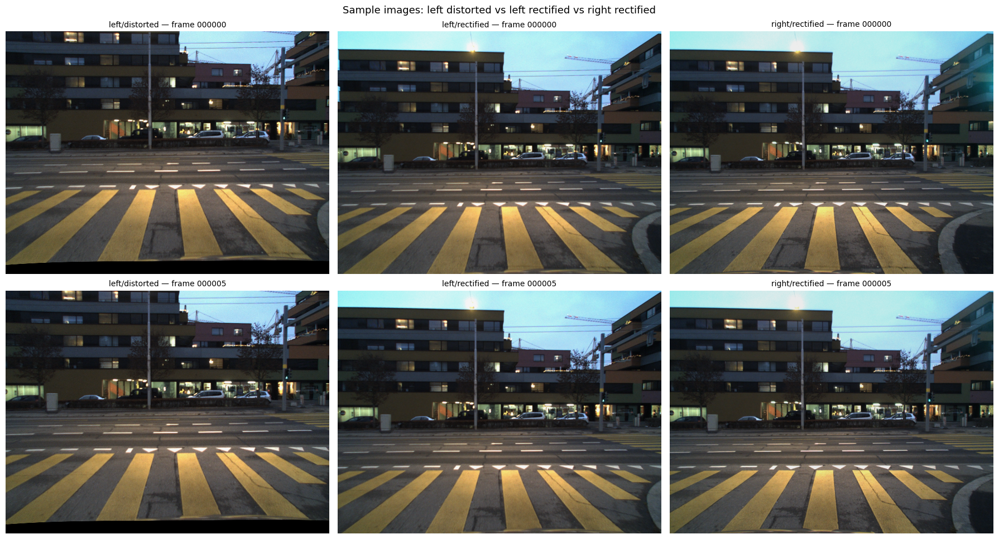

left/distorted: shape=(480, 640, 3), dtype=uint8, file_size=0.53 MB
left/rectified: shape=(1080, 1440, 3), dtype=uint8, file_size=2.45 MB
right/rectified: shape=(1080, 1440, 3), dtype=uint8, file_size=2.49 MB


In [6]:
# --- Display sample images: distorted vs rectified (left), and right rectified ---
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

img_folders = {
    "left/distorted": DATA_DIR / "images" / "left" / "distorted",
    "left/rectified": DATA_DIR / "images" / "left" / "rectified",
    "right/rectified": DATA_DIR / "images" / "right" / "rectified",
}

# Row 0: first frame from each folder
# Row 1: a later frame from each folder
sample_indices = [0, 5]

for row, idx in enumerate(sample_indices):
    for col, (label, folder) in enumerate(img_folders.items()):
        imgs = sorted(folder.glob("*.png"))
        if idx < len(imgs):
            img = cv2.imread(str(imgs[idx]))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[row, col].imshow(img)
            axes[row, col].set_title(f"{label} — frame {imgs[idx].stem}", fontsize=10)
        axes[row, col].axis("off")

plt.suptitle("Sample images: left distorted vs left rectified vs right rectified", fontsize=13)
plt.tight_layout()
plt.show()

# Print image dimensions
for label, folder in img_folders.items():
    sample = sorted(folder.glob("*.png"))[0]
    img = cv2.imread(str(sample))
    print(f"{label}: shape={img.shape}, dtype={img.dtype}, file_size={sample.stat().st_size/1e6:.2f} MB")

In [7]:
# --- How much does RGB weigh? ---
print("--- RGB image sizes ---")
for label, folder in [
    ("left/distorted",  DATA_DIR / "images" / "left"  / "distorted"),
    ("left/rectified",  DATA_DIR / "images" / "left"  / "rectified"),
    ("right/rectified", DATA_DIR / "images" / "right" / "rectified"),
]:
    imgs = sorted(folder.glob("*.png"))
    if not imgs:
        print(f"  {label}: no files found")
        continue
    sample = cv2.imread(str(imgs[0]))
    disk_mb  = imgs[0].stat().st_size / 1e6
    mem_mb   = sample.nbytes / 1e6
    print(f"  {label}: shape={sample.shape}  |  {disk_mb:.2f} MB/file on disk  |  {mem_mb:.2f} MB/frame in memory")

--- RGB image sizes ---
  left/distorted: shape=(480, 640, 3)  |  0.53 MB/file on disk  |  0.92 MB/frame in memory
  left/rectified: shape=(1080, 1440, 3)  |  2.45 MB/file on disk  |  4.67 MB/frame in memory
  right/rectified: shape=(1080, 1440, 3)  |  2.49 MB/file on disk  |  4.67 MB/frame in memory


In [8]:
# --- Explore events H5 structure ---
events_path = DATA_DIR / "events" / "right" / "events.h5"
rectify_map_path = DATA_DIR / "events" / "right" / "rectify_map.h5"

if events_path.exists():
    with h5py.File(events_path, "r") as f:
        print("=== events.h5 structure ===")
        def show_h5(name, obj):
            if isinstance(obj, h5py.Dataset):
                print(f"  {name}: shape={obj.shape}, dtype={obj.dtype}")
        f.visititems(show_h5)

        # Quick stats on events
        n_events = f["events/x"].shape[0]
        t_start  = f["events/t"][0]
        t_end    = f["events/t"][-1]
        duration_s = (t_end - t_start) / 1e6  # timestamps are in microseconds
        print(f"\n  Total events: {n_events:,}")
        print(f"  Time span: {t_start} → {t_end} ({duration_s:.2f} s)")
        print(f"  Event rate: {n_events/duration_s/1e6:.2f} M events/s")
else:
    print("Events file not downloaded yet — run the events download cell first.")

print()
with h5py.File(rectify_map_path, "r") as f:
    print("=== rectify_map.h5 structure ===")
    def show_h5_rm(name, obj):
        if isinstance(obj, h5py.Dataset):
            print(f"  {name}: shape={obj.shape}, dtype={obj.dtype}")
    f.visititems(show_h5_rm)

=== events.h5 structure ===
  events/p: shape=(799317843,), dtype=uint8
  events/t: shape=(799317843,), dtype=uint32
  events/x: shape=(799317843,), dtype=uint16
  events/y: shape=(799317843,), dtype=uint16
  ms_to_idx: shape=(61202,), dtype=uint64
  t_offset: shape=(), dtype=int64

  Total events: 799,317,843
  Time span: 1 → 61200999 (61.20 s)
  Event rate: 13.06 M events/s

=== rectify_map.h5 structure ===
  rectify_map: shape=(480, 640, 2), dtype=float32


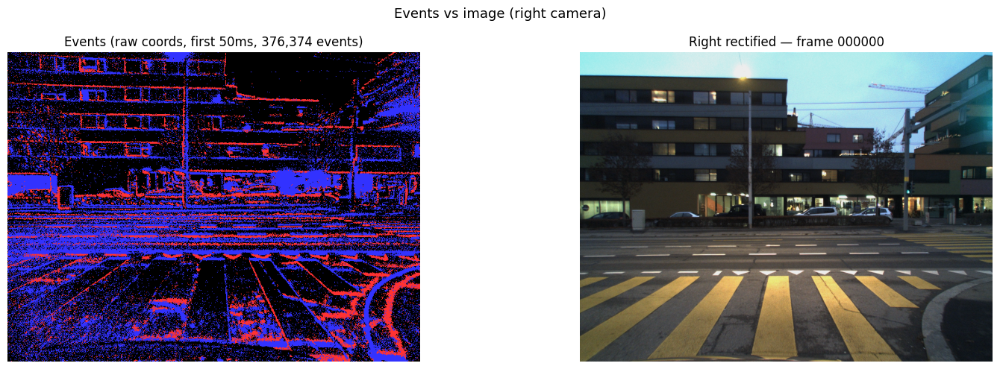

Events in window: 376,374
Positive: 211,321, Negative: 165,053
Event frame shape: (480, 640, 3)


In [9]:
# --- Display events as a frame (accumulate events over a short window) ---
if events_path.exists():
    with h5py.File(events_path, "r") as f:
        x = f["events/x"]
        y = f["events/y"]
        t = f["events/t"]
        p = f["events/p"]

        # Get image dimensions from rectify map
        with h5py.File(rectify_map_path, "r") as rm:
            rect_map = rm["rectify_map"][:]
            H, W = rect_map.shape[:2]

        # Accumulate first 50ms of events into a frame
        t0 = t[0]
        window_us = 50_000  # 50 ms
        # Find index where t exceeds t0 + window
        # Binary search via numpy
        chunk_size = min(1_000_000, x.shape[0])
        t_chunk = t[:chunk_size]
        end_idx = np.searchsorted(t_chunk, t0 + window_us)
        end_idx = min(end_idx, chunk_size)

        x_slice = x[:end_idx]
        y_slice = y[:end_idx]
        p_slice = p[:end_idx]

        # Create event frame: red = positive, blue = negative
        event_frame = np.zeros((H, W, 3), dtype=np.uint8)
        pos_mask = p_slice[:] == 1
        neg_mask = ~pos_mask

        xv, yv = x_slice[:], y_slice[:]
        # Clamp to valid range
        valid = (xv >= 0) & (xv < W) & (yv >= 0) & (yv < H)

        for mask, color in [(pos_mask & valid, [255, 50, 50]), (neg_mask & valid, [50, 50, 255])]:
            event_frame[yv[mask], xv[mask]] = color

        fig, axes = plt.subplots(1, 2, figsize=(16, 5))

        # Left: event frame (raw coordinates)
        axes[0].imshow(event_frame)
        axes[0].set_title(f"Events (raw coords, first 50ms, {end_idx:,} events)")
        axes[0].axis("off")

        # Right: corresponding image frame
        img_right = sorted((DATA_DIR / "images" / "right" / "rectified").glob("*.png"))
        if img_right:
            img = cv2.imread(str(img_right[0]))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[1].imshow(img)
            axes[1].set_title(f"Right rectified — frame {img_right[0].stem}")
            axes[1].axis("off")

        plt.suptitle("Events vs image (right camera)", fontsize=13)
        plt.tight_layout()
        plt.show()

        print(f"Events in window: {end_idx:,}")
        print(f"Positive: {pos_mask.sum():,}, Negative: {neg_mask.sum():,}")
        print(f"Event frame shape: {event_frame.shape}")
else:
    print("Events file not downloaded yet.")

In [10]:
# --- Object detection labels: explore tracks.npy ---
tracks_path = DATA_DIR / "object_detections" / "left" / "tracks.npy"
tracks = np.load(tracks_path, allow_pickle=True)

print(f"tracks.npy: shape={tracks.shape}, dtype={tracks.dtype}")
print(f"Fields: {tracks.dtype.names}")
print(f"\nFirst 5 entries:")
for i in range(min(5, len(tracks))):
    tr = tracks[i]
    print(f"  [{i}] t={tr['t']}, bbox=({tr['x']:.0f},{tr['y']:.0f},{tr['w']:.0f},{tr['h']:.0f}), "
          f"class={tr['class_id']} conf={tr['class_confidence']:.2f} track={tr['track_id']}")

print(f"\nCoordinate ranges:")
print(f"  x:   {tracks['x'].min():.0f} — {tracks['x'].max():.0f}")
print(f"  y:   {tracks['y'].min():.0f} — {tracks['y'].max():.0f}")
print(f"  w:   {tracks['w'].min():.0f} — {tracks['w'].max():.0f}")
print(f"  h:   {tracks['h'].min():.0f} — {tracks['h'].max():.0f}")
print(f"  x+w: max {(tracks['x'] + tracks['w']).max():.0f}  (distorted image is 640 wide)")
print(f"  y+h: max {(tracks['y'] + tracks['h']).max():.0f}  (distorted image is 480 tall)")

tracks.npy: shape=(8399,), dtype=[('t', '<u8'), ('x', '<f4'), ('y', '<f4'), ('w', '<f4'), ('h', '<f4'), ('class_id', 'u1'), ('class_confidence', '<f4'), ('track_id', '<u4')]
Fields: ('t', 'x', 'y', 'w', 'h', 'class_id', 'class_confidence', 'track_id')

First 5 entries:
  [0] t=56246407530, bbox=(654,188,9,16), class=0 conf=0.63 track=175
  [1] t=56246407530, bbox=(446,194,75,31), class=2 conf=1.00 track=120
  [2] t=56246407530, bbox=(-10,205,94,28), class=2 conf=1.00 track=156
  [3] t=56246407530, bbox=(224,189,82,23), class=2 conf=0.99 track=155
  [4] t=56246407530, bbox=(122,205,82,26), class=2 conf=0.98 track=160

Coordinate ranges:
  x:   -17 — 671
  y:   85 — 290
  w:   5 — 240
  h:   6 — 302
  x+w: max 678  (distorted image is 640 wide)
  y+h: max 432  (distorted image is 480 tall)


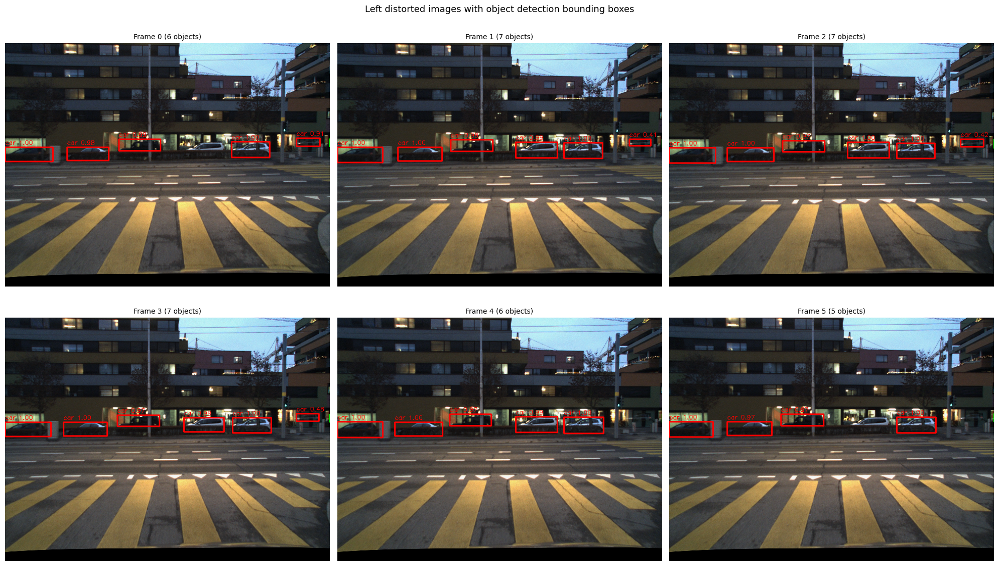

In [ ]:
# TODO do this with the right images, by applying the calibration, worsct case scenario just remove the black bar below


# --- Display images with bounding boxes ---
# DSEC-det tracks: structured array (t, x, y, w, h, class_id, class_confidence, track_id)
# Bbox coords are in distorted image space (640x480), NOT rectified (1440x1080)

# Load image timestamps to match bboxes to frames
img_timestamps_path = DATA_DIR / "images" / "timestamps.txt"
img_timestamps = np.loadtxt(img_timestamps_path, dtype=np.int64)

# Use left/distorted images since bboxes match that resolution
available_imgs = sorted((DATA_DIR / "images" / "left" / "distorted").glob("*.png"))
available_indices = [int(p.stem) for p in available_imgs]

CLASS_NAMES = {0: "pedestrian", 1: "rider", 2: "car", 3: "bus", 4: "truck",
               5: "bicycle", 6: "motorcycle", 7: "train"}
CLASS_COLORS = {0: (0,255,0), 1: (255,165,0), 2: (255,0,0), 3: (0,0,255),
                4: (128,0,128), 5: (255,255,0), 6: (0,255,255), 7: (128,128,0)}

n_show = min(6, len(available_indices))
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

for ax_idx in range(n_show):
    frame_idx = available_indices[ax_idx]
    row, col = divmod(ax_idx, 3)
    img_path = DATA_DIR / "images" / "left" / "distorted" / f"{frame_idx:06d}.png"
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H_img, W_img = img.shape[:2]

    # Find bboxes near this frame's timestamp
    frame_ts = img_timestamps[frame_idx]
    half_interval = 25_000  # 25ms (half of 50ms inter-frame interval)

    mask = (tracks["t"] >= frame_ts - half_interval) & (tracks["t"] < frame_ts + half_interval)
    frame_tracks = tracks[mask]
    for tr in frame_tracks:
        x = max(0, int(tr["x"]))
        y = max(0, int(tr["y"]))
        w, h = int(tr["w"]), int(tr["h"])
        x2 = min(x + w, W_img)
        y2 = min(y + h, H_img)
        cls = int(tr["class_id"])
        color = CLASS_COLORS.get(cls, (255, 255, 255))
        cv2.rectangle(img, (x, y), (x2, y2), color, 2)
        label = f"{CLASS_NAMES.get(cls, str(cls))} {tr['class_confidence']:.2f}"
        cv2.putText(img, label, (x, max(y - 5, 12)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)

    axes[row, col].imshow(img)
    axes[row, col].set_title(f"Frame {frame_idx} ({len(frame_tracks)} objects)", fontsize=10)
    axes[row, col].axis("off")

for ax_idx in range(n_show, 6):
    row, col = divmod(ax_idx, 3)
    axes[row, col].axis("off")

plt.suptitle("Left distorted images with object detection bounding boxes", fontsize=13)
plt.tight_layout()
plt.show()

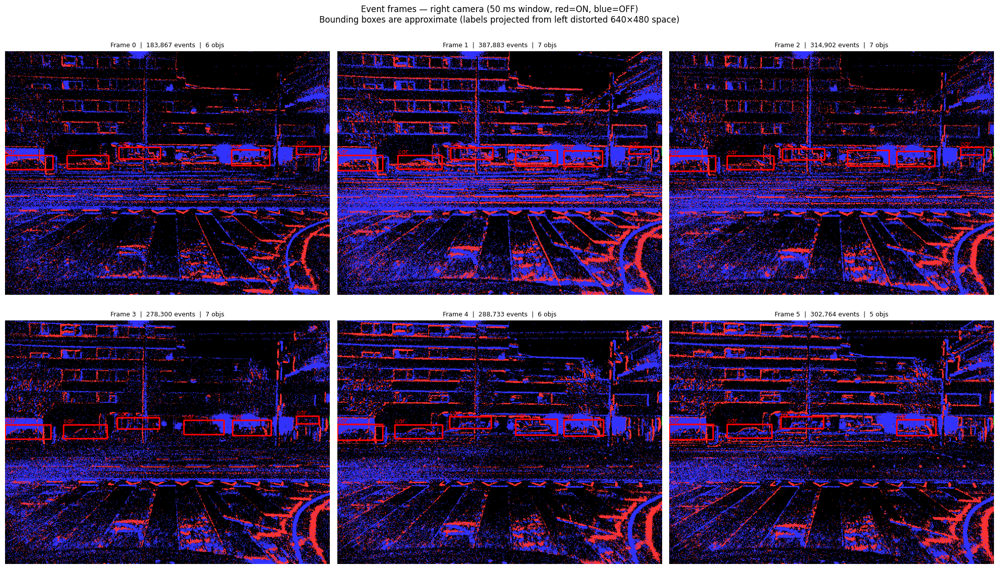

In [12]:
# --- Event frames sequence with bounding boxes ---
# Groups events in 50ms windows aligned to each sample image frame.
# Boxes come from left-cam distorted space (640x480); right event cam is also 640x480,
# so the overlay is approximate (small baseline between cameras) — good enough for exploration.

def get_events_in_window(f, t_start_us, t_end_us):
    """Efficiently slice events in an absolute-time window using the ms_to_idx lookup."""
    t_offset  = int(f["t_offset"][()])
    ms_to_idx = f["ms_to_idx"][:]

    rel_start = t_start_us - t_offset
    rel_end   = t_end_us   - t_offset

    ms_start  = max(0, int(rel_start // 1000))
    ms_end    = min(len(ms_to_idx) - 1, int(rel_end // 1000) + 1)

    idx_start = int(ms_to_idx[ms_start])
    idx_end   = int(ms_to_idx[ms_end])

    t_slice = f["events/t"][idx_start:idx_end].astype(np.int64) + t_offset
    keep    = (t_slice >= t_start_us) & (t_slice < t_end_us)

    return (
        f["events/x"][idx_start:idx_end][keep],
        f["events/y"][idx_start:idx_end][keep],
        f["events/p"][idx_start:idx_end][keep],
    )

if events_path.exists():
    with h5py.File(rectify_map_path, "r") as rm:
        H_ev, W_ev = rm["rectify_map"].shape[:2]

    n_show      = min(6, len(available_indices))
    half_win_us = 25_000  # 25 ms on each side → 50 ms window total

    fig, axes = plt.subplots(2, 3, figsize=(20, 12))

    with h5py.File(events_path, "r") as f:
        for ax_idx in range(n_show):
            frame_idx = available_indices[ax_idx]
            row, col  = divmod(ax_idx, 3)
            frame_ts  = img_timestamps[frame_idx]

            xv, yv, pv = get_events_in_window(f, frame_ts - half_win_us, frame_ts + half_win_us)

            # Build RGB event frame: red = positive, blue = negative
            ev_frame = np.zeros((H_ev, W_ev, 3), dtype=np.uint8)
            valid = (xv < W_ev) & (yv < H_ev)
            pos   = valid & (pv == 1)
            neg   = valid & (pv == 0)
            ev_frame[yv[pos], xv[pos]] = [255, 50,  50]
            ev_frame[yv[neg], xv[neg]] = [50,  50, 255]

            # Overlay bounding boxes
            frame_tracks = tracks[
                (tracks["t"] >= frame_ts - half_win_us) &
                (tracks["t"] <  frame_ts + half_win_us)
            ]
            for tr in frame_tracks:
                bx  = max(0, int(tr["x"]))
                by  = max(0, int(tr["y"]))
                bx2 = min(bx + int(tr["w"]), W_ev)
                by2 = min(by + int(tr["h"]), H_ev)
                cls   = int(tr["class_id"])
                color = CLASS_COLORS.get(cls, (255, 255, 255))
                cv2.rectangle(ev_frame, (bx, by), (bx2, by2), color, 2)
                cv2.putText(ev_frame, CLASS_NAMES.get(cls, str(cls)),
                            (bx, max(by - 4, 12)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)

            axes[row, col].imshow(ev_frame)
            axes[row, col].set_title(
                f"Frame {frame_idx}  |  {len(xv):,} events  |  {len(frame_tracks)} objs",
                fontsize=9,
            )
            axes[row, col].axis("off")

    for ax_idx in range(n_show, 6):
        row, col = divmod(ax_idx, 3)
        axes[row, col].axis("off")

    plt.suptitle(
        "Event frames — right camera (50 ms window, red=ON, blue=OFF)\n"
        "Bounding boxes are approximate (labels projected from left distorted 640×480 space)",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()
else:
    print("Events file not downloaded yet.")

## 5 — Data insights summary

In [13]:
# --- Data insights ---
print("=" * 60)
print("DSEC zurich_city_02_b — Data Summary")
print("=" * 60)

# Image counts (from R2, full sequence)
print(f"\n--- Images (full sequence from R2) ---")
for sub in ["images/left/distorted", "images/left/rectified", "images/right/rectified"]:
    n = count_r2_objects(f"{SEQUENCE}/{sub}/")
    print(f"  {sub}: {n} frames")

# Image properties
sample_img = cv2.imread(str(sorted((DATA_DIR / "images" / "right" / "rectified").glob("*.png"))[0]))
print(f"  Image resolution: {sample_img.shape[1]}x{sample_img.shape[0]} (WxH)")
print(f"  Channels: {sample_img.shape[2]}, dtype: {sample_img.dtype}")

# Timestamps
print(f"\n--- Timestamps ---")
print(f"  Image timestamps: {len(img_timestamps)} entries")
if len(img_timestamps) > 1:
    intervals = np.diff(img_timestamps)
    fps = 1e6 / np.median(intervals)
    print(f"  Median interval: {np.median(intervals)/1e3:.1f} ms → ~{fps:.1f} FPS")
    duration = (img_timestamps[-1] - img_timestamps[0]) / 1e6
    print(f"  Sequence duration: {duration:.2f} s")

# Events
if events_path.exists():
    print(f"\n--- Events (right camera) ---")
    with h5py.File(events_path, "r") as f:
        n_ev = f["events/x"].shape[0]
        t0 = f["events/t"][0]
        t1 = f["events/t"][-1]
        dur = (t1 - t0) / 1e6
        print(f"  Total events: {n_ev:,}")
        print(f"  Duration: {dur:.2f} s")
        print(f"  Event rate: {n_ev/dur/1e6:.2f} Mev/s")
        print(f"  File size: {events_path.stat().st_size/1e9:.2f} GB")

# Object detections
print(f"\n--- Object Detections ---")
print(f"  tracks.npy shape: {tracks.shape}, dtype: {tracks.dtype}")
if tracks.dtype.names:
    print(f"  Fields: {tracks.dtype.names}")
    unique_classes = np.unique(tracks["class_id"])
    print(f"  Unique classes: {len(unique_classes)}")
    for cls_id in unique_classes:
        n = (tracks["class_id"] == cls_id).sum()
        name = CLASS_NAMES.get(int(cls_id), f"class_{int(cls_id)}")
        print(f"    {name}: {n:,} detections")
    unique_tracks = np.unique(tracks["track_id"])
    print(f"  Unique track IDs: {len(unique_tracks)}")
print("=" * 60)

DSEC zurich_city_02_b — Data Summary

--- Images (full sequence from R2) ---
  images/left/distorted: 1225 frames
  images/left/rectified: 1225 frames
  images/right/rectified: 1225 frames
  Image resolution: 1440x1080 (WxH)
  Channels: 3, dtype: uint8

--- Timestamps ---
  Image timestamps: 1225 entries
  Median interval: 50.0 ms → ~20.0 FPS
  Sequence duration: 61.20 s

--- Events (right camera) ---
  Total events: 799,317,843
  Duration: 61.20 s
  Event rate: 13.06 Mev/s
  File size: 1.63 GB

--- Object Detections ---
  tracks.npy shape: (8399,), dtype: [('t', '<u8'), ('x', '<f4'), ('y', '<f4'), ('w', '<f4'), ('h', '<f4'), ('class_id', 'u1'), ('class_confidence', '<f4'), ('track_id', '<u4')]
  Fields: ('t', 'x', 'y', 'w', 'h', 'class_id', 'class_confidence', 'track_id')
  Unique classes: 7
    pedestrian: 818 detections
    rider: 18 detections
    car: 6,169 detections
    bus: 1,188 detections
    truck: 131 detections
    bicycle: 25 detections
    motorcycle: 50 detections
  Uni

## 6 — Preprocess data for v2e

v2e converts a frame-based video into synthetic DVS events.
It accepts either a video file or a folder of sequentially-named images plus a per-frame timestamp file.

Our right-rectified PNGs are already sequentially named; we just need to:
1. Point v2e at the image folder  
2. Provide per-frame timestamps (in seconds) so v2e knows the real exposure timing  
3. (Optionally) extend the download from 10 → N frames for a longer sequence

In [14]:
# install 


In [15]:
# --- (Optional) Download more frames ---
# Change N_FRAMES to get a longer sequence; 10 is enough to test v2e.
N_FRAMES = 30

img_folder_r2  = f"{SEQUENCE}/images/right/rectified"
img_folder_loc = DATA_DIR / "images" / "right" / "rectified"

_, all_objects = list_r2_objects(img_folder_r2, delimiter="", max_keys=N_FRAMES)
needed = [(obj["Key"], img_folder_loc / obj["Key"].split("/")[-1])
          for obj in all_objects
          if not (img_folder_loc / obj["Key"].split("/")[-1]).exists()]

if needed:
    print(f"Downloading {len(needed)} additional frames ...")
    with ThreadPoolExecutor(max_workers=8) as pool:
        futures = {pool.submit(download_file, k, p): k for k, p in needed}
        for fut in as_completed(futures):
            print(fut.result())
else:
    print("All frames already on disk.")

All frames already on disk.


In [16]:
# --- Build v2e input: image folder + timestamps file ---
# v2e expects a folder of PNGs + a timestamps.txt (one float per line, seconds).

v2e_input_dir = DATA_DIR / "v2e_input" / "right_rectified"
v2e_input_dir.mkdir(parents=True, exist_ok=True)

# Collect frame files we have locally, sorted by frame index
local_frames = sorted(img_folder_loc.glob("*.png"), key=lambda p: int(p.stem))
frame_indices = [int(p.stem) for p in local_frames]

print(f"Frames available locally: {len(local_frames)}")
print(f"Frame index range: {frame_indices[0]} — {frame_indices[-1]}")

# Copy / symlink images into v2e_input_dir with clean sequential naming
# (v2e reads them in sorted order, so the names need to be consistent)
for new_idx, src_path in enumerate(local_frames):
    dst = v2e_input_dir / f"{new_idx:06d}.png"
    if not dst.exists():
        dst.symlink_to(src_path.resolve())

print(f"v2e image folder ready: {v2e_input_dir}  ({len(local_frames)} frames)")

# Write per-frame timestamps in seconds (v2e --timestamp_list format)
ts_seconds = img_timestamps[frame_indices] / 1e6  # µs → s
# Normalise to start at 0
ts_seconds = ts_seconds - ts_seconds[0]

v2e_ts_path = DATA_DIR / "v2e_input" / "timestamps.txt"
np.savetxt(str(v2e_ts_path), ts_seconds, fmt="%.9f")
print(f"Timestamps file written: {v2e_ts_path}")
print(f"  Duration: {ts_seconds[-1]:.3f} s  |  {len(ts_seconds)} frames  |  ~{1/(np.median(np.diff(ts_seconds))):.1f} FPS")

# Overview of expected v2e call
print("\n--- Suggested v2e command ---")
print(f"python v2e.py \\")
print(f"  --input_folder {v2e_input_dir} \\")
print(f"  --timestamp_list {v2e_ts_path} \\")
print(f"  --output_folder {DATA_DIR / 'v2e_output'} \\")
print(f"  --dvs_exposure duration 0.005 \\")
print(f"  --dvs346  \\")
print(f"  --no_preview")

Frames available locally: 30
Frame index range: 0 — 29
v2e image folder ready: ../data/dsec_sample/zurich_city_02_b/v2e_input/right_rectified  (30 frames)
Timestamps file written: ../data/dsec_sample/zurich_city_02_b/v2e_input/timestamps.txt
  Duration: 1.450 s  |  30 frames  |  ~20.0 FPS

--- Suggested v2e command ---
python v2e.py \
  --input_folder ../data/dsec_sample/zurich_city_02_b/v2e_input/right_rectified \
  --timestamp_list ../data/dsec_sample/zurich_city_02_b/v2e_input/timestamps.txt \
  --output_folder ../data/dsec_sample/zurich_city_02_b/v2e_output \
  --dvs_exposure duration 0.005 \
  --dvs346  \
  --no_preview


## 7 — Processing the data (v2e simulation)

Run v2e on the **left/distorted** 640×480 PNG frames to produce synthetic DVS events, then visualise the first 6 event-frames with DSEC ground-truth bounding boxes overlaid.

Steps:
1. Clone & install v2e (skipped if already present)
2. Run v2e → `v2e_output/dvs_events.txt`
3. Load the simulated events
4. Display event frames + bboxes (red=ON, blue=OFF)

In [17]:
# --- Install v2e (clones repo if absent, then pip-installs in editable mode) ---
import subprocess, sys

V2E_DIR = (DATA_DIR.parent.parent.parent / "tools" / "v2e").resolve()
V2E_DIR.parent.mkdir(parents=True, exist_ok=True)

if not (V2E_DIR / "v2e.py").exists():
    print(f"Cloning v2e into {V2E_DIR} ...")
    subprocess.check_call([
        "git", "clone", "--depth=1",
        "https://github.com/SensorsINI/v2e", str(V2E_DIR),
    ])
    print("Clone done.")
else:
    print(f"v2e already present at {V2E_DIR}")

result = subprocess.run(
    [sys.executable, "-m", "pip", "install", "-e", str(V2E_DIR),
     "-q", "--no-warn-script-location"],
    capture_output=True, text=True,
)
if result.returncode != 0:
    print("pip stderr:", result.stderr[-500:])
    raise RuntimeError("pip install of v2e failed — see stderr above")
print("v2e ready")

v2e already present at /home/jose/Documents/projects/neuromorph_vs_noise/noise_in_snn/tools/v2e
v2e ready


In [18]:
# --- Run v2e on left/distorted 640×480 PNGs ---
v2e_in_dir  = DATA_DIR / "images" / "left" / "distorted"
v2e_out_dir = DATA_DIR / "v2e_output"
v2e_out_dir.mkdir(parents=True, exist_ok=True)

frames_in = sorted(v2e_in_dir.glob("*.png"), key=lambda p: int(p.stem))
print(f"Input : {len(frames_in)} frames at 640×480  ({v2e_in_dir})")
print(f"Output: {v2e_out_dir}")

cmd = [
    sys.executable, str(V2E_DIR / "v2e.py"),
    "--input",            str(v2e_in_dir),
    "--input_frame_rate", "20",
    "--output_folder",    str(v2e_out_dir),
    "--overwrite",
    "--output_width",     "640",
    "--output_height",    "480",
    "--disable_slomo",
    "--dvs_params",       "clean",
    "--dvs_text",         "dvs_events.txt",
    "--skip_video_output",
    "--no_preview",
]

print("\nRunning v2e ...")
result = subprocess.run(cmd, capture_output=True, text=True)
out = result.stdout
print(out[-3000:] if len(out) > 3000 else out)

if result.returncode != 0:
    print("--- STDERR ---")
    print(result.stderr[-1500:])
    raise RuntimeError("v2e exited with non-zero return code — see output above")

dvs_txt = v2e_out_dir / "dvs_events.txt"
if dvs_txt.exists():
    print(f"\nEvents file: {dvs_txt}  ({dvs_txt.stat().st_size / 1e3:.1f} KB)")
else:
    print("WARNING: dvs_events.txt not found — check v2e output above.")

Input : 10 frames at 640×480  (../data/dsec_sample/zurich_city_02_b/images/left/distorted)
Output: ../data/dsec_sample/zurich_city_02_b/v2e_output

Running v2e ...


Events file: ../data/dsec_sample/zurich_city_02_b/v2e_output/dvs_events.txt  (27452.0 KB)


In [19]:
# --- Load simulated events from dvs_events.txt ---
dvs_txt = v2e_out_dir / "dvs_events.txt"
print(f"Loading {dvs_txt} ...")

sim_raw = np.loadtxt(str(dvs_txt), comments="#")
if sim_raw.ndim == 1:
    sim_raw = sim_raw[None, :]

t_sim = sim_raw[:, 0]
x_sim = sim_raw[:, 1].astype(np.int32)
y_sim = sim_raw[:, 2].astype(np.int32)
p_sim = sim_raw[:, 3].astype(np.int8)

print(f"Simulated events : {len(t_sim):,}")
print(f"  time span      : {t_sim[0]:.4f}s -> {t_sim[-1]:.4f}s")
print(f"  ON             : {(p_sim == 1).sum():,}   OFF: {(p_sim == 0).sum():,}")
print(f"  x              : {x_sim.min()} - {x_sim.max()}   y: {y_sim.min()} - {y_sim.max()}")

Loading ../data/dsec_sample/zurich_city_02_b/v2e_output/dvs_events.txt ...
Simulated events : 938,300
  time span      : 0.0023s -> 0.4500s
  ON             : 461,677   OFF: 476,623
  x              : 0 - 639   y: 0 - 461


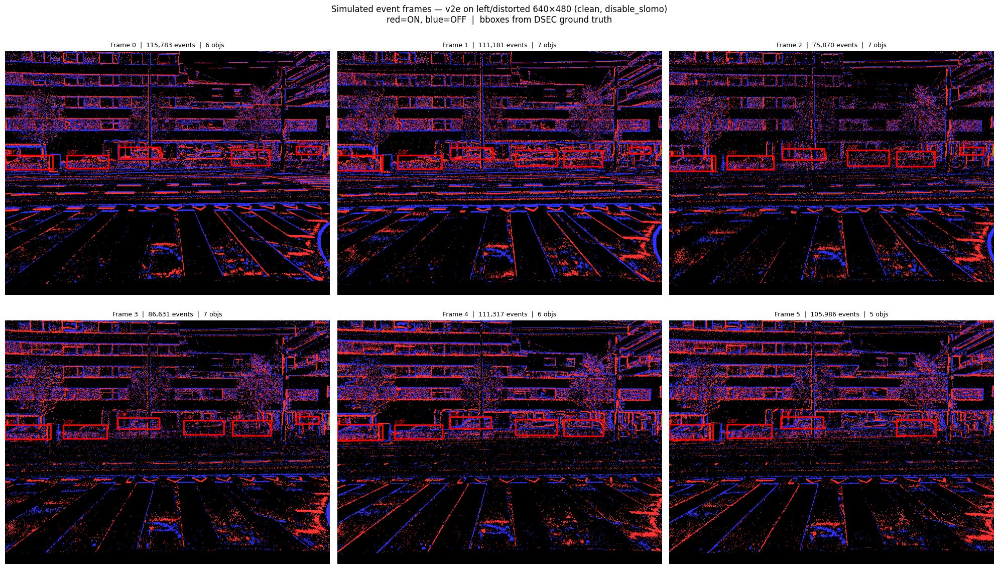

In [ ]:
# --- Display first 6 simulated event frames with DSEC bounding boxes ---
distorted_dir    = DATA_DIR / "images" / "left" / "distorted"
available_frames = sorted(distorted_dir.glob("*.png"), key=lambda p: int(p.stem))
frame_indices    = [int(p.stem) for p in available_frames]

# Absolute µs timestamps → v2e-normalised seconds (start at 0)
ts_s_abs  = img_timestamps[frame_indices] / 1e6
ts_s_norm = ts_s_abs - ts_s_abs[0]

half_win_s  = 0.025   # ±25 ms window around each frame
half_win_us = 25_000  # same in µs for DSEC bbox lookup

n_show = min(6, len(frame_indices))
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

for ax_idx in range(n_show):
    row, col = divmod(ax_idx, 3)
    frame_idx     = frame_indices[ax_idx]
    frame_ts_v2e  = ts_s_norm[ax_idx]
    frame_ts_dsec = img_timestamps[frame_idx]

    # Simulated events in ±25 ms window
    mask = (t_sim >= frame_ts_v2e - half_win_s) & (t_sim < frame_ts_v2e + half_win_s)
    xv, yv, pv = x_sim[mask], y_sim[mask], p_sim[mask]

    # Black canvas — red=ON, blue=OFF
    ev_frame = np.zeros((480, 640, 3), dtype=np.uint8)
    valid = (xv >= 0) & (xv < 640) & (yv >= 0) & (yv < 480)
    pos, neg = valid & (pv == 1), valid & (pv == 0)
    ev_frame[yv[pos], xv[pos]] = [255, 50, 50]
    ev_frame[yv[neg], xv[neg]] = [50, 50, 255]

    # DSEC ground-truth bboxes
    frame_tracks = tracks[
        (tracks["t"] >= frame_ts_dsec - half_win_us) &
        (tracks["t"] <  frame_ts_dsec + half_win_us)
    ]
    for tr in frame_tracks:
        bx  = max(0, int(tr["x"]))
        by  = max(0, int(tr["y"]))
        bx2 = min(bx + int(tr["w"]), 640)
        by2 = min(by + int(tr["h"]), 480)
        cls   = int(tr["class_id"])
        color = CLASS_COLORS.get(cls, (255, 255, 255))
        cv2.rectangle(ev_frame, (bx, by), (bx2, by2), color, 2)
        cv2.putText(ev_frame, CLASS_NAMES.get(cls, str(cls)),
                    (bx, max(by - 4, 12)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)

    axes[row, col].imshow(ev_frame)
    axes[row, col].set_title(
        f"Frame {frame_idx}  |  {mask.sum():,} events  |  {len(frame_tracks)} objs",
        fontsize=9)
    axes[row, col].axis("off")

for ax_idx in range(n_show, 6):
    row, col = divmod(ax_idx, 3)
    axes[row, col].axis("off")

plt.suptitle(
    "Simulated event frames — v2e on left/distorted 640×480 (clean, disable_slomo)\n"
    "red=ON, blue=OFF  |  bboxes from DSEC ground truth",
    fontsize=12)
plt.tight_layout()
plt.show()